In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
mdismailbhuiyan_braintumor_path = kagglehub.dataset_download('mdismailbhuiyan/braintumor')

print('Data source import complete.')


In [ ]:
!pip install -q -U "ultralytics" pandas matplotlib scikit-learn pyyaml albumentations tqdm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 2.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 100.7 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 108.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 105.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 99.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 79.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# === Common utilities & dataset detection ===
import os, sys, random, json, shutil
from pathlib import Path
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# locate dataset root - searches common Kaggle input patterns
def find_dataset_root():
    kaggle_input = Path('/kaggle/input')
    if kaggle_input.exists():
        # prefer a top-level BrainTumor folder if it exists
        for name in ['BrainTumor', 'braintumor', 'Brain-Tumor', 'brain-tumor']:
            p = kaggle_input / name
            if p.exists():
                return p
        # otherwise search children for likely names
        for child in kaggle_input.iterdir():
            if child.is_dir() and any(n in child.name.lower() for n in ['brain', 'tumor', 'yolov8', 'yolov9', 'yolo11', 'yolov11']):
                return child
        return kaggle_input  # fallback
    # Colab fallback: mount or use working dir
    return Path('.')

DATA_ROOT = find_dataset_root()
print("DATA_ROOT detected:", DATA_ROOT)

# Working directories
WORK_DIR = Path('/kaggle/working/baselines/yolo11') if Path('/kaggle').exists() else Path('./working/baselines/yolo11')
WORK_DIR.mkdir(parents=True, exist_ok=True)

CLASSES = ['glioma','meningioma','pituitary']

def save_text(path, text):
    Path(path).parent.mkdir(parents=True, exist_ok=True)
    Path(path).write_text(text)

# ultralytics-style data.yaml writer
def write_ultralytics_data_yaml(train_images, val_images, test_images, names=CLASSES, out_path='data.yaml'):
    import yaml
    d = {
        'train': str(train_images),
        'val': str(val_images),
        'test': str(test_images),
        'names': list(names)  # Ultralytics accepts list or {i:name}
    }
    save_text(out_path, yaml.safe_dump(d, sort_keys=False))
    print("Wrote", out_path)

# PR-curve utility (image-level, per-class presence)
from sklearn.metrics import precision_recall_curve, average_precision_score
def save_pr_curve(y_true, y_scores, class_names, out_file):
    plt.figure(figsize=(8,6))
    for i, cname in enumerate(class_names):
        try:
            precision, recall, _ = precision_recall_curve(y_true[:, i], y_scores[:, i])
            ap = average_precision_score(y_true[:, i], y_scores[:, i])
            plt.plot(recall, precision, label=f"{cname} (AP={ap:.3f})")
        except Exception as e:
            print("PR plot error for", cname, e)
    plt.xlabel('Recall'); plt.ylabel('Precision'); plt.title('Precision-Recall curves')
    plt.legend(); plt.grid(True)
    plt.savefig(out_file, bbox_inches='tight')
    plt.close()
    print("Saved PR curve to", out_file)


DATA_ROOT detected: /kaggle/input/braintumor


In [ ]:
# === prepare dataset paths (supports valid/val and multiple extensions) ===
def has_split(root, split_name):
    return (root / split_name / 'images').exists() and (root / split_name / 'labels').exists()

# Try common subfolders the user mentioned
candidates = ['BrainTumorYolov8','BrainTumorYolov9','BrainTumorYolov11']
dset_dir = None

top_candidate = DATA_ROOT
for c in candidates:
    p = DATA_ROOT / c
    if p.exists():
        dset_dir = p
        break

# fallback: pick a folder that contains train/images
if dset_dir is None:
    if has_split(DATA_ROOT, 'train'):
        dset_dir = DATA_ROOT
    else:
        for child in DATA_ROOT.rglob('*'):
            if child.is_dir() and has_split(child, 'train'):
                dset_dir = child
                break

if dset_dir is None:
    raise FileNotFoundError("Could not find dataset folder with train/images and labels. "
                            "Place dataset under /kaggle/input or adjust the search logic.")

# Handle 'valid' vs 'val'
VAL_NAME = 'valid' if has_split(dset_dir, 'valid') else ('val' if has_split(dset_dir, 'val') else None)
if VAL_NAME is None:
    raise FileNotFoundError("Validation split not found. Expected 'valid/' or 'val/' with images/labels.")

TRAIN_IMGS = dset_dir / 'train' / 'images'
VAL_IMGS   = dset_dir / VAL_NAME / 'images'
TEST_IMGS  = (dset_dir / 'test' / 'images') if (dset_dir / 'test' / 'images').exists() else VAL_IMGS

def count_imgs(p):
    exts = ['*.jpg','*.jpeg','*.png','*.bmp']
    return sum(len(list(p.glob(e))) for e in exts)

print("Using dataset directory:", dset_dir)
print("Counts (train/val/test images):", count_imgs(TRAIN_IMGS), count_imgs(VAL_IMGS), count_imgs(TEST_IMGS))

# Write ultralytics data.yaml into working dir
data_yaml_path = WORK_DIR / 'yolo11_data.yaml'
write_ultralytics_data_yaml(TRAIN_IMGS, VAL_IMGS, TEST_IMGS, CLASSES, out_path=str(data_yaml_path))


Using dataset directory: /kaggle/input/braintumor/BrainTumor/BrainTumorYolov8
Counts (train/val/test images): 2144 612 308
Wrote /kaggle/working/baselines/yolo11/yolo11_data.yaml


In [ ]:
# === YOLO-11 training loop ===
import torch
from ultralytics import YOLO
from tqdm import tqdm
import pandas as pd
import numpy as np

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Torch device:", device)

# Training policies tuned for Kaggle T4/V100 limits (adjust as needed)
policies = [
    {'name':'tiny',   'imgsz':512,'batch':12,'epochs':35,'lr':5e-4},
    {'name':'small',  'imgsz':640,'batch':8, 'epochs':30,'lr':1e-3},
    {'name':'medium', 'imgsz':768,'batch':6, 'epochs':40,'lr':8e-4},
]

project_dir = WORK_DIR / 'runs'
project_dir.mkdir(parents=True, exist_ok=True)

# Use YOLO-11 nano weights (smallest to start). You can switch to yolo11s/m/l/x later.
base_model = 'yolo11n.pt'  # will auto-download if missing

for pol in policies:
    run_name = f"yolo11_{pol['name']}_img{pol['imgsz']}_e{pol['epochs']}_bs{pol['batch']}"
    run_dir = project_dir / run_name
    run_dir.mkdir(parents=True, exist_ok=True)
    print(f"\n=== Starting run {run_name} ===")
    model = YOLO(base_model)

    try:
        model.train(
            data=str(data_yaml_path),
            imgsz=pol['imgsz'],
            epochs=pol['epochs'],
            batch=pol['batch'],
            lr0=pol['lr'],
            device=0 if device=='cuda' else -1,
            project=str(project_dir),
            name=run_name,
            exist_ok=True,
            workers=2,

            # ---- augmentations (Ultralytics-native) ----
            hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
            degrees=10, translate=0.1, scale=0.5, shear=2.0, perspective=0.0005,
            flipud=0.2, fliplr=0.5,
            mosaic=1.0, mixup=0.2,
        )
    except Exception as e:
        print("Training error:", e)
        continue

    # Save a copy of results.csv if present
    results_csv = run_dir / 'results.csv'
    if results_csv.exists():
        df = pd.read_csv(results_csv)
        df.to_csv(run_dir / 'metrics_saved.csv', index=False)
        print("Saved metrics to", run_dir / 'metrics_saved.csv')
    else:
        print("No results.csv found for", run_name)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Torch device: cuda

=== Starting run yolo11_tiny_img512_e35_bs12 ===
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/baselines/yolo11/yolo11_data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=35, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.2, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like


                   all        612        612      0.879      0.873      0.927      0.585
                glioma        285        285      0.805      0.741      0.839      0.465
            meningioma        142        142      0.938      0.955       0.98      0.665
             pituitary        185        185      0.893      0.924      0.963      0.625
Speed: 0.1ms preprocess, 1.5ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /kaggle/working/baselines/yolo11/runs/yolo11_tiny_img512_e35_bs12
Saved metrics to /kaggle/working/baselines/yolo11/runs/yolo11_tiny_img512_e35_bs12/metrics_saved.csv

=== Starting run yolo11_small_img640_e30_bs8 ===
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmi

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like


                   all        612        612      0.862      0.844      0.895      0.597
                glioma        285        285      0.833      0.632      0.769       0.45
            meningioma        142        142      0.934      0.965      0.972       0.69
             pituitary        185        185       0.82      0.936      0.945       0.65
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/baselines/yolo11/runs/yolo11_small_img640_e30_bs8
Saved metrics to /kaggle/working/baselines/yolo11/runs/yolo11_small_img640_e30_bs8/metrics_saved.csv

=== Starting run yolo11_medium_img768_e40_bs6 ===
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=6, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutm

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like


                   all        612        612      0.886      0.903      0.936       0.59
                glioma        285        285        0.8      0.774      0.847      0.485
            meningioma        142        142       0.97      0.972      0.988      0.664
             pituitary        185        185      0.888      0.962      0.972      0.622
Speed: 0.3ms preprocess, 3.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /kaggle/working/baselines/yolo11/runs/yolo11_medium_img768_e40_bs6
Saved metrics to /kaggle/working/baselines/yolo11/runs/yolo11_medium_img768_e40_bs6/metrics_saved.csv


In [ ]:
# === Evaluate last/best run ===
from ultralytics import YOLO
from sklearn.metrics import average_precision_score, precision_score, recall_score, f1_score, accuracy_score

# find most recent run directory
runs = sorted([p for p in project_dir.iterdir() if p.is_dir()], key=lambda p: p.stat().st_mtime)
if not runs:
    raise RuntimeError("No runs found. Make sure training completed.")
best_run = runs[-1]
best_weights = best_run / 'weights' / 'best.pt'
if not best_weights.exists():
    # fall back to last.pt if best.pt not saved
    if (best_run / 'weights' / 'last.pt').exists():
        best_weights = best_run / 'weights' / 'last.pt'
    else:
        raise FileNotFoundError("No weights found in run folder: " + str(best_run))

print("Using weights:", best_weights)
model = YOLO(str(best_weights))

# ---- 5A) Ultralytics validation metrics (true detection mAP etc.) ----
# This prints a validation table and returns a metrics object with .box.map, .box.map50, etc.
metrics = model.val(data=str(data_yaml_path), split='val', device=0 if torch.cuda.is_available() else -1, verbose=True)
# Robust readout; metrics.box holds detection metrics
try:
    print("\n=== Ultralytics Validation (Detection) ===")
    print(f"mAP50-95: {metrics.box.map:.4f}")
    print(f"mAP50:    {metrics.box.map50:.4f}")
    print(f"mAP75:    {metrics.box.map75:.4f}")
    print(f"Mean Precision: {metrics.box.mp:.4f} | Mean Recall: {metrics.box.mr:.4f}")
except Exception as e:
    print("Could not read metrics.box fields; object schema may differ. Raw metrics:", metrics)

# ---- 5B) Image-level presence metrics (your requested prints) ----
# Build a list of validation images (common extensions)
exts = ['*.jpg','*.jpeg','*.png','*.bmp']
val_images = []
for ext in exts:
    val_images += list(VAL_IMGS.glob(ext))
val_images = sorted(val_images)
print("Val images to evaluate:", len(val_images))
# Limit for speed if extremely large; adjust/remove as needed
MAX_EVAL = 2000
if len(val_images) > MAX_EVAL:
    val_images = val_images[:MAX_EVAL]
    print(f"Evaluating a subset for speed: {len(val_images)} images")

all_scores = []
all_gt = []

for img_path in val_images:
    try:
        res = model.predict(source=str(img_path), imgsz=640,
                            device=0 if torch.cuda.is_available() else -1, verbose=False)
        boxes = res[0].boxes if len(res)>0 else None
        score_vec = np.zeros(len(CLASSES), dtype=float)
        if boxes is not None and getattr(boxes, 'data', None) is not None and len(boxes.data)>0:
            bnp = boxes.data.cpu().numpy()
            # take max confidence per class as image-level score
            for b in bnp:
                conf = float(b[4]); cls = int(b[5])
                if 0 <= cls < len(CLASSES):
                    score_vec[cls] = max(score_vec[cls], conf)
    except Exception as e:
        print("Prediction error on", img_path, e)
        score_vec = np.zeros(len(CLASSES), dtype=float)

    # read YOLO label file to get GT presence per class
    lbl_file = (img_path.parent.parent / 'labels' / (img_path.stem + '.txt'))
    present = np.zeros(len(CLASSES), dtype=int)
    if lbl_file.exists():
        for line in lbl_file.read_text().splitlines():
            if not line.strip():
                continue
            cls = int(line.split()[0])
            if 0 <= cls < len(CLASSES):
                present[cls] = 1

    all_scores.append(score_vec)
    all_gt.append(present)

all_scores = np.vstack(all_scores)
all_gt = np.vstack(all_gt)

# Save arrays
np.save(best_run / 'pr_preds.npy', all_scores)
np.save(best_run / 'pr_gt.npy', all_gt)

# AP per class and mAP (image-level)
aps = {CLASSES[i]: float(average_precision_score(all_gt[:,i], all_scores[:,i])) for i in range(len(CLASSES))}
map_image_level = float(np.mean(list(aps.values())))
pd.DataFrame({'class':list(aps.keys()), 'ap':[aps[k] for k in aps]}).to_csv(best_run / 'aps_per_class.csv', index=False)

# Threshold to compute accuracy/precision/recall/F1
thr = 0.5
y_true = all_gt
y_pred_bin = (all_scores >= thr).astype(int)

accuracy        = accuracy_score(y_true.flatten(), y_pred_bin.flatten())  # per-label accuracy
precision_micro = precision_score(y_true, y_pred_bin, average='micro', zero_division=0)
recall_micro    = recall_score(y_true, y_pred_bin, average='micro', zero_division=0)
f1_micro        = f1_score(y_true, y_pred_bin, average='micro', zero_division=0)

print("\n=== Printed Evaluation Metrics (Image-level presence) ===")
print(f"Accuracy (per label, flattened): {accuracy:.4f}")
print(f"Precision (micro):               {precision_micro:.4f}")
print(f"Recall (micro):                  {recall_micro:.4f}")
print(f"F1-score (micro):                {f1_micro:.4f}")
print("\nAP per class (image-level):")
for cname, apv in aps.items():
    print(f"  {cname}: {apv:.4f}")
print(f"mAP (macro, image-level):        {map_image_level:.4f}")
print("==============================================")

# Save PR curve plot
pr_out = best_run / 'pr_curve.png'
save_pr_curve(all_gt, all_scores, CLASSES, str(pr_out))
print("Saved per-class APs to:", best_run / 'aps_per_class.csv')
print("Saved PR curve to:", pr_out)


Using weights: /kaggle/working/baselines/yolo11/runs/yolo11_medium_img768_e40_bs6/weights/best.pt
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 28.4±6.8 MB/s, size: 30.9 KB)
val: Scanning /kaggle/input/braintumor/BrainTumor/BrainTumorYolov8/valid/labels... 612 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 612/612 444.0it/s 1.4s
WARNING ⚠️ val: Cache directory /kaggle/input/braintumor/BrainTumor/BrainTumorYolov8/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 39/39 5.7it/s 6.9s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  X : float or int or array-like


                   all        612        612      0.884      0.906      0.935       0.59
                glioma        285        285      0.793      0.779      0.846      0.484
            meningioma        142        142      0.969      0.972      0.988      0.666
             pituitary        185        185      0.888      0.968      0.972      0.621
Speed: 0.9ms preprocess, 5.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val

=== Ultralytics Validation (Detection) ===
mAP50-95: 0.5903
mAP50:    0.9354
mAP75:    0.7203
Mean Precision: 0.8836 | Mean Recall: 0.9061
Val images to evaluate: 612

=== Printed Evaluation Metrics (Image-level presence) ===
Accuracy (per label, flattened): 0.9493
Precision (micro):               0.9869
Recall (micro):                  0.8595
F1-score (micro):                0.9188

AP per class (image-level):
  glioma: 0.9712
  meningioma: 0.9642
  pituitary: 0.9862
mAP (macro, image-level):        0.9739
Saved PR curve 

In [ ]:
print("Artifacts saved under:", project_dir)
print("Example run folders:", [p.name for p in project_dir.iterdir() if p.is_dir()][:10])
print("Latest run:", best_run.name)
print("Weights used:", best_weights)


Artifacts saved under: /kaggle/working/baselines/yolo11/runs
Example run folders: ['yolo11_medium_img768_e40_bs6', 'yolo11_small_img640_e30_bs8', 'yolo11_tiny_img512_e35_bs12']
Latest run: yolo11_medium_img768_e40_bs6
Weights used: /kaggle/working/baselines/yolo11/runs/yolo11_medium_img768_e40_bs6/weights/best.pt



📊 Showing results for: yolo11_medium_img768_e40_bs6



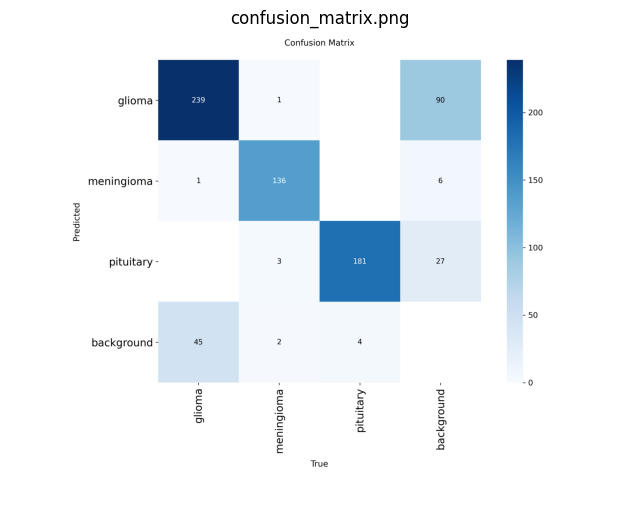

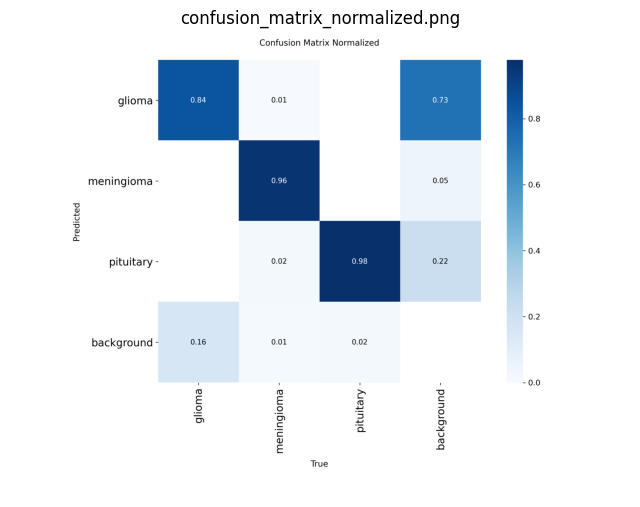

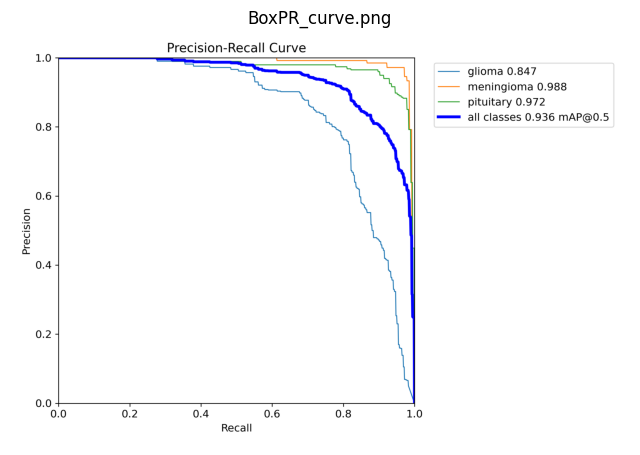

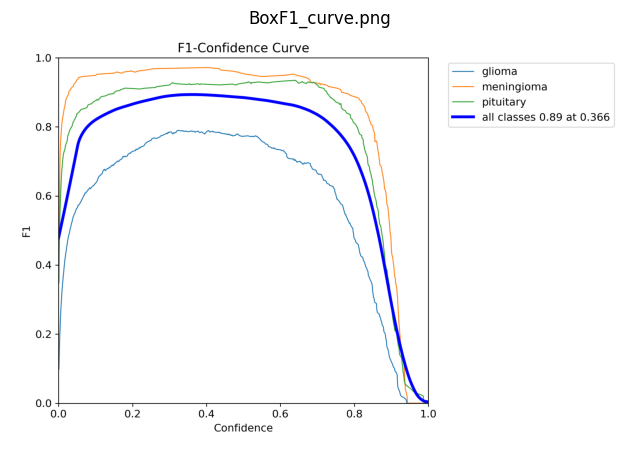

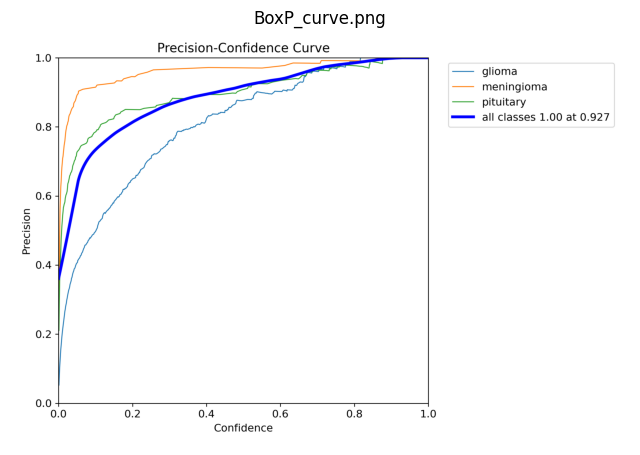

...

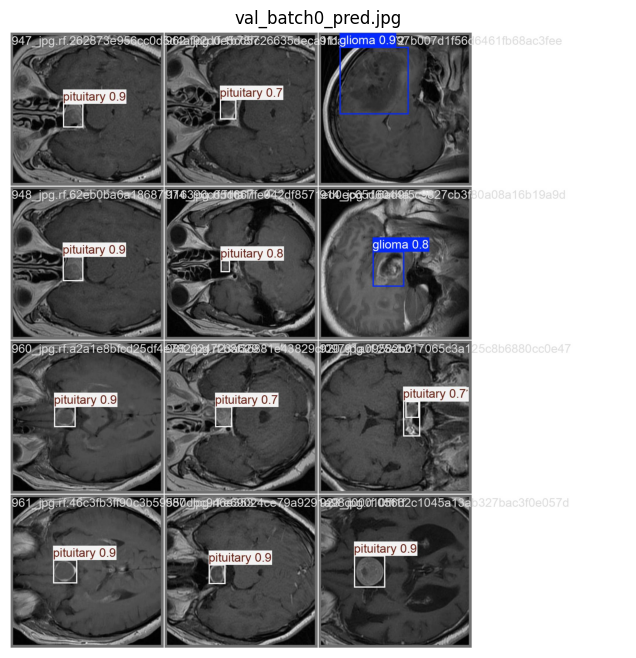

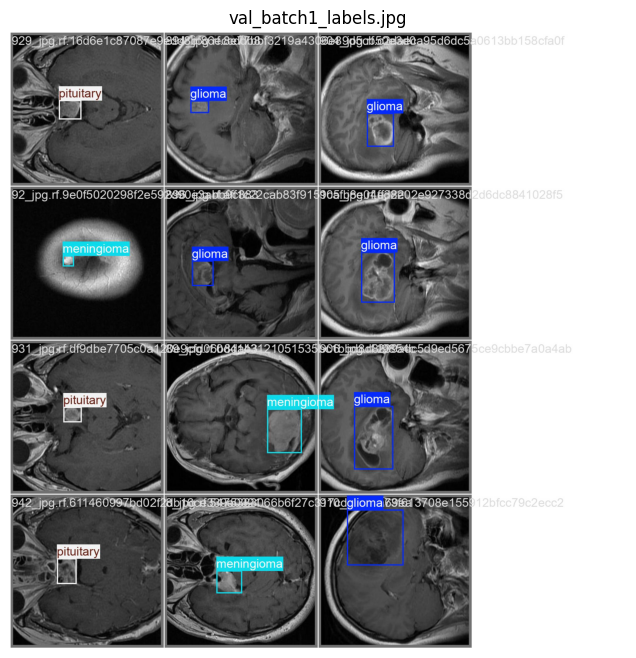

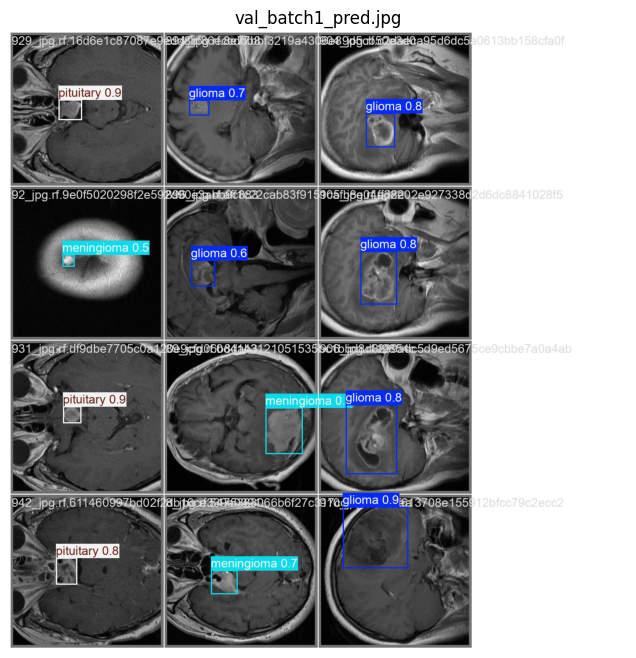

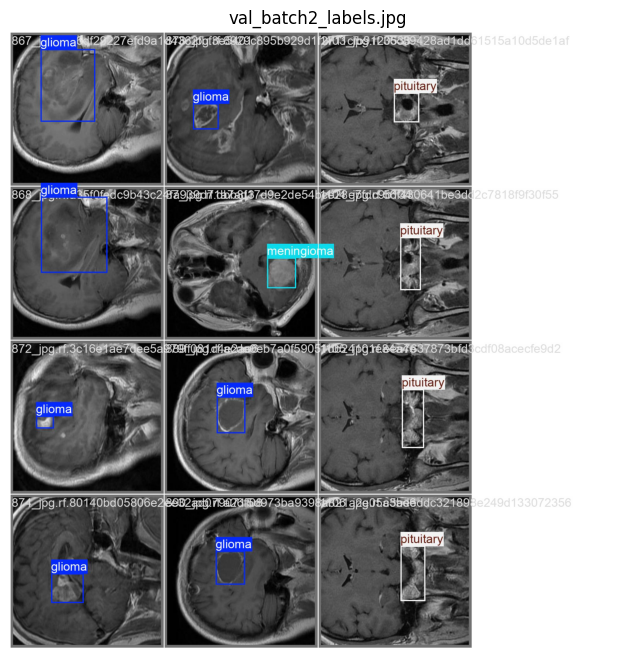

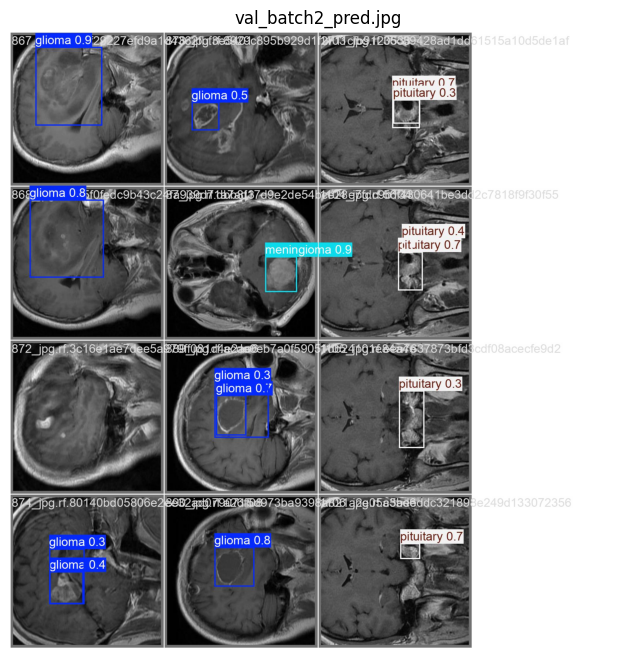


📊 Showing results for: yolo11_small_img640_e30_bs8



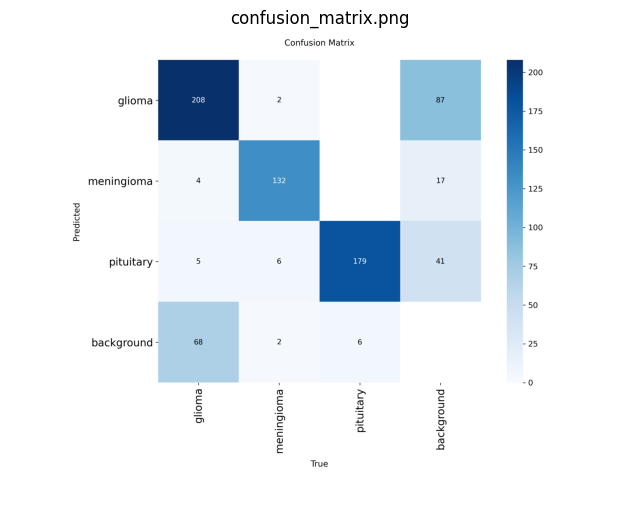

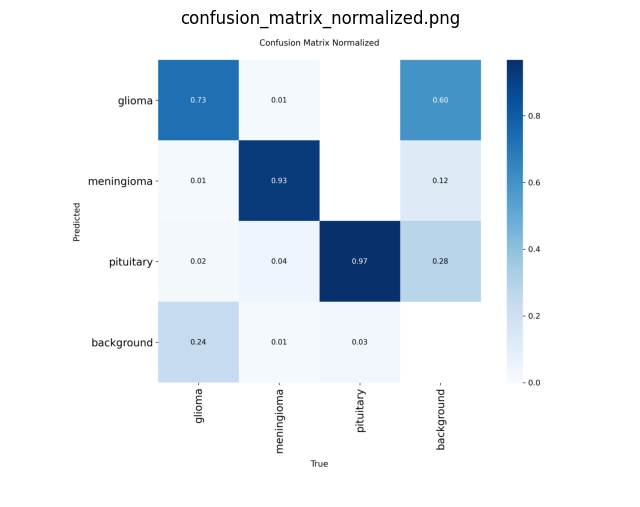

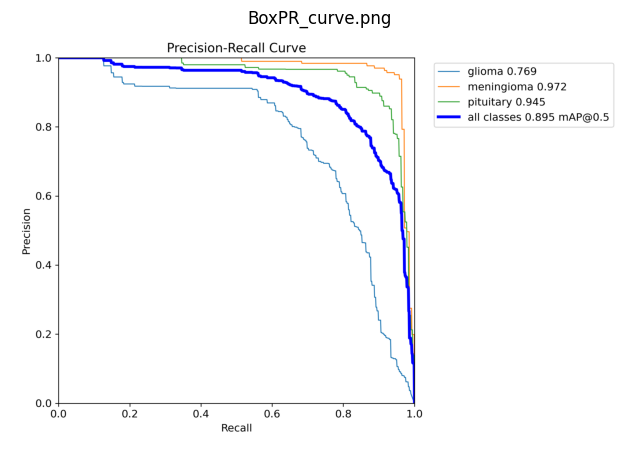

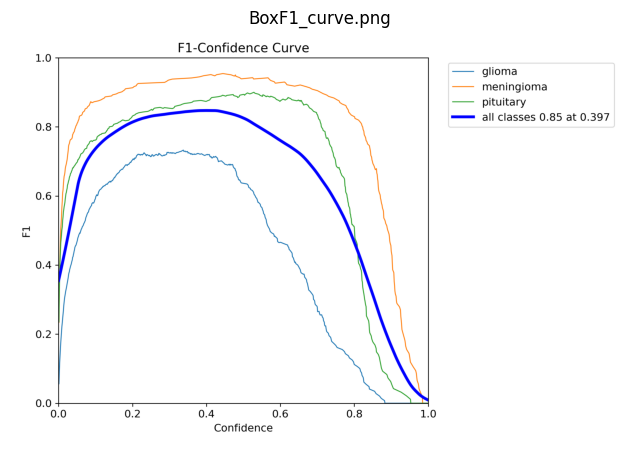

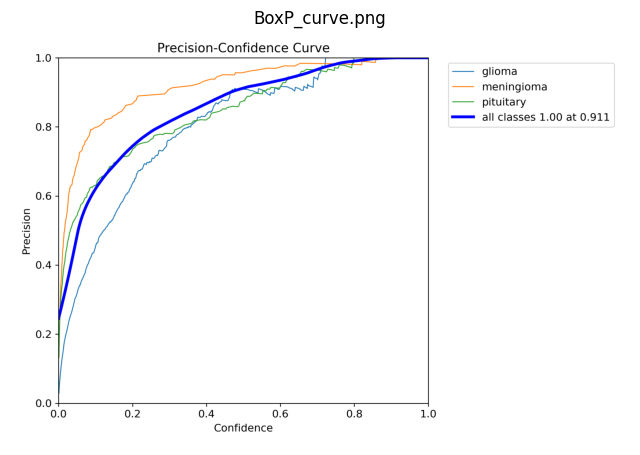

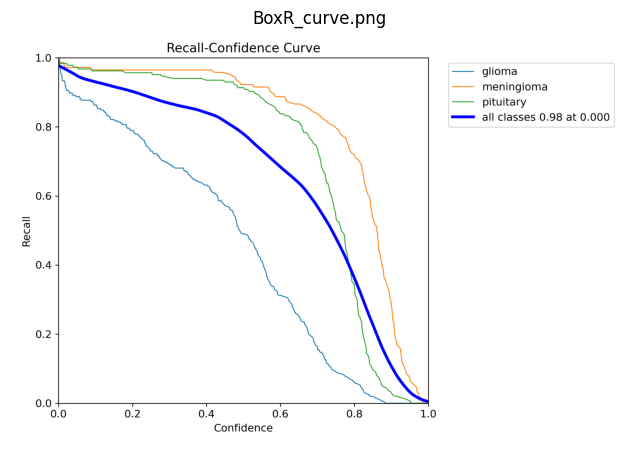

⚠️ Missing: pr_curve.png


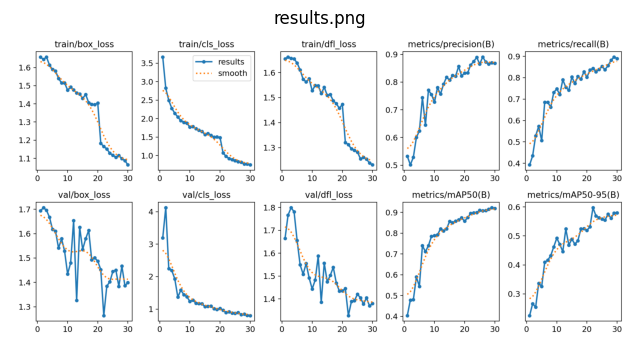

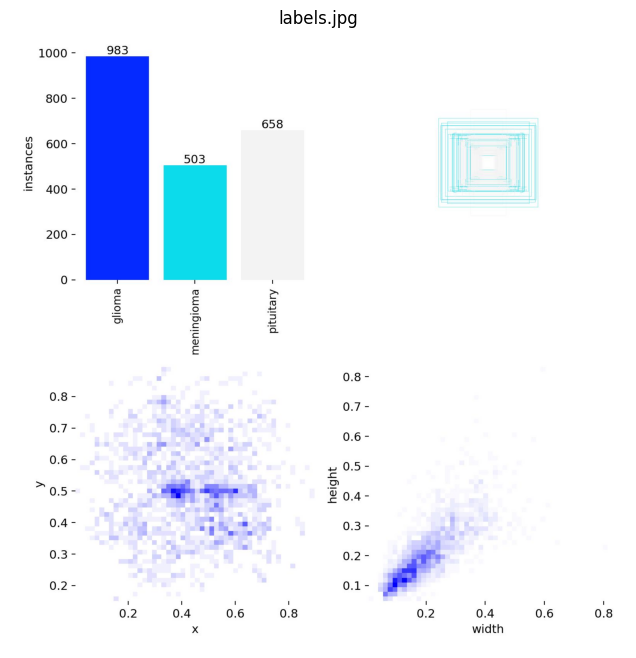

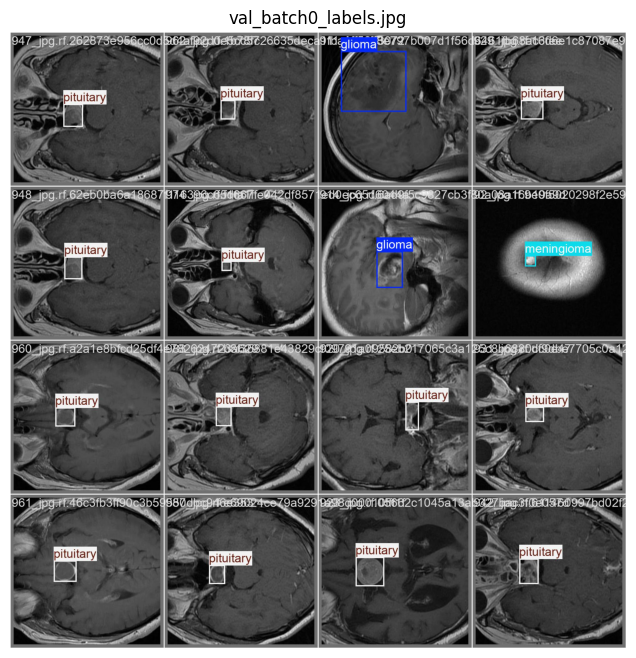

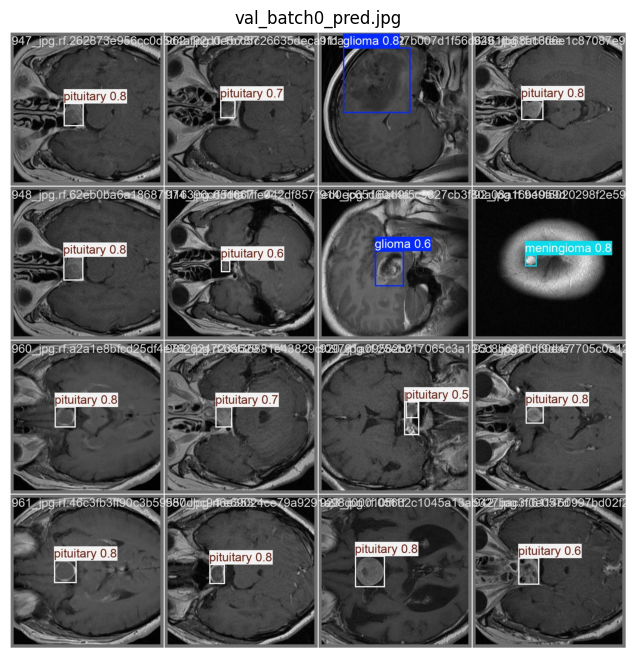

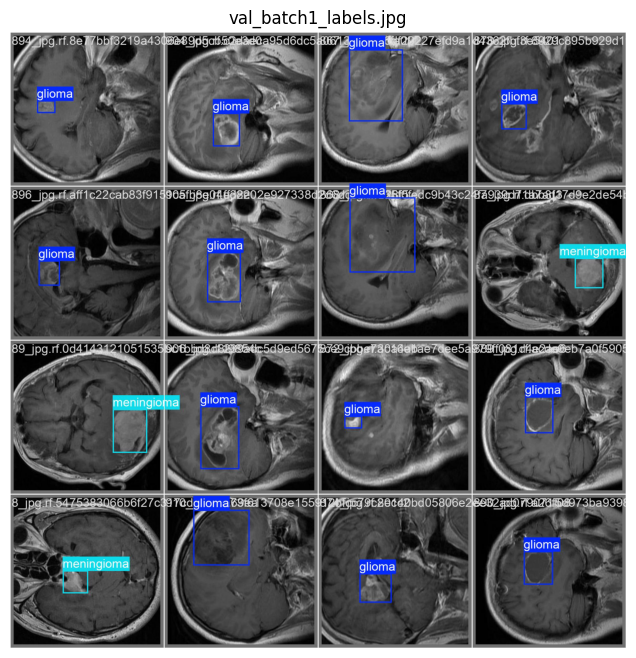

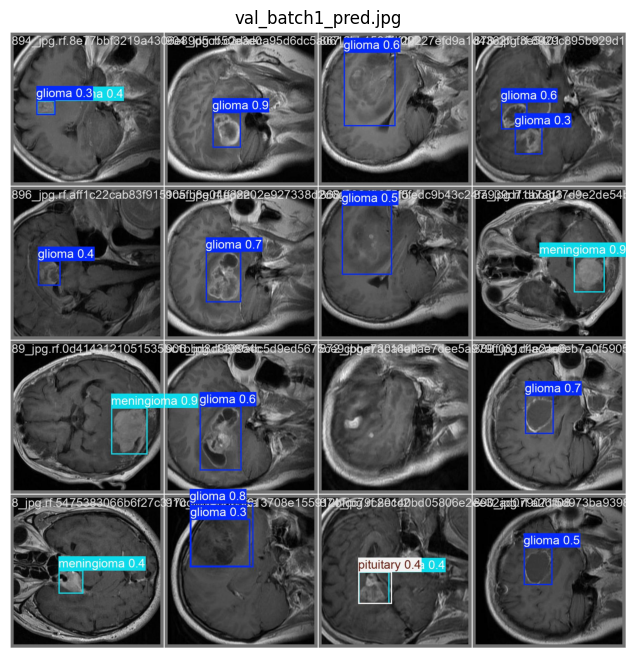

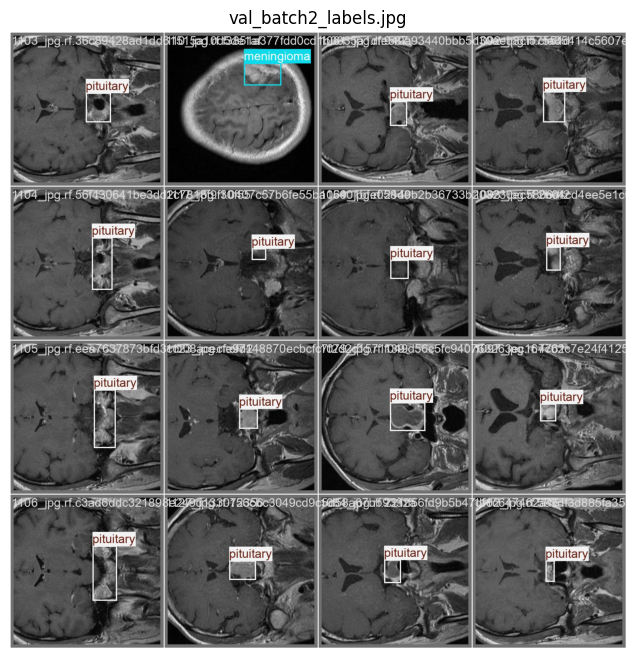

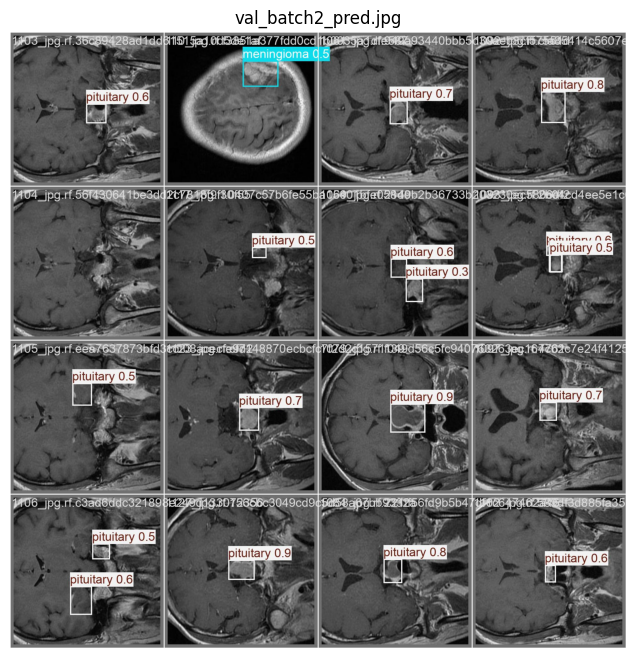


📊 Showing results for: yolo11_tiny_img512_e35_bs12



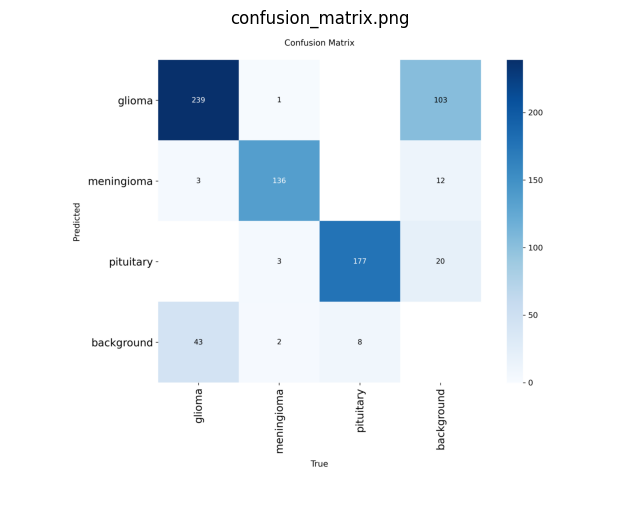

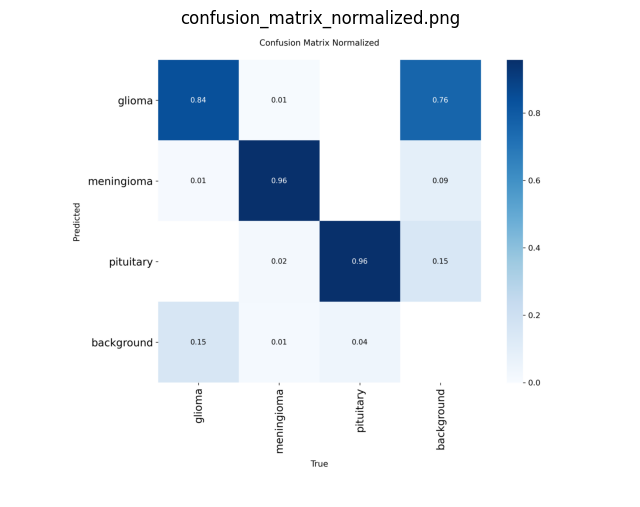

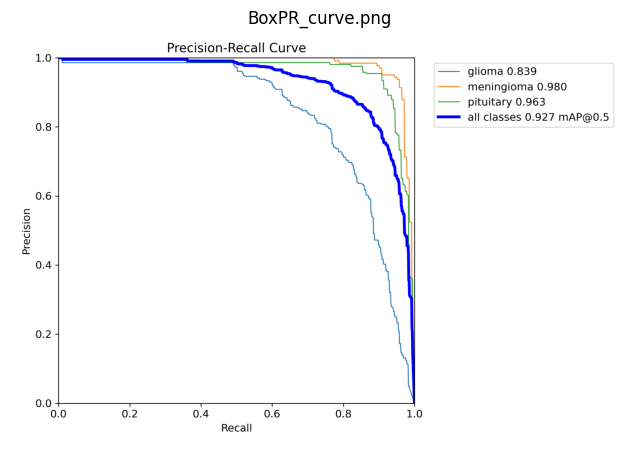

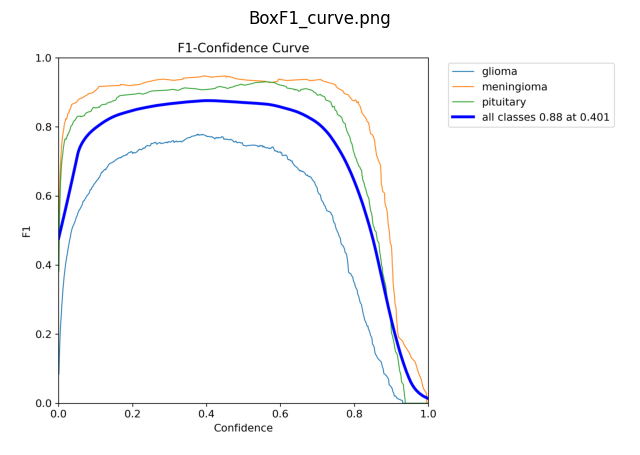

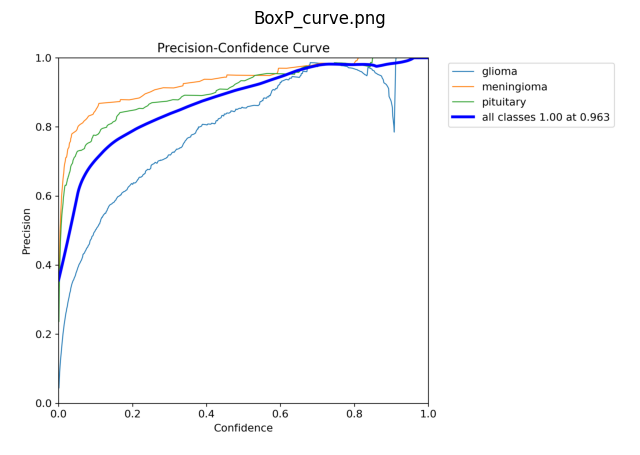

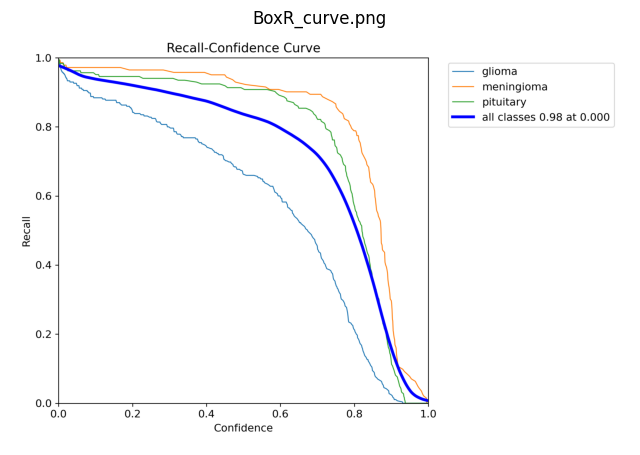

⚠️ Missing: pr_curve.png


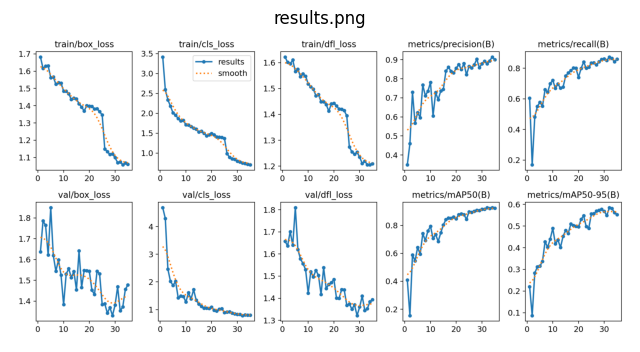

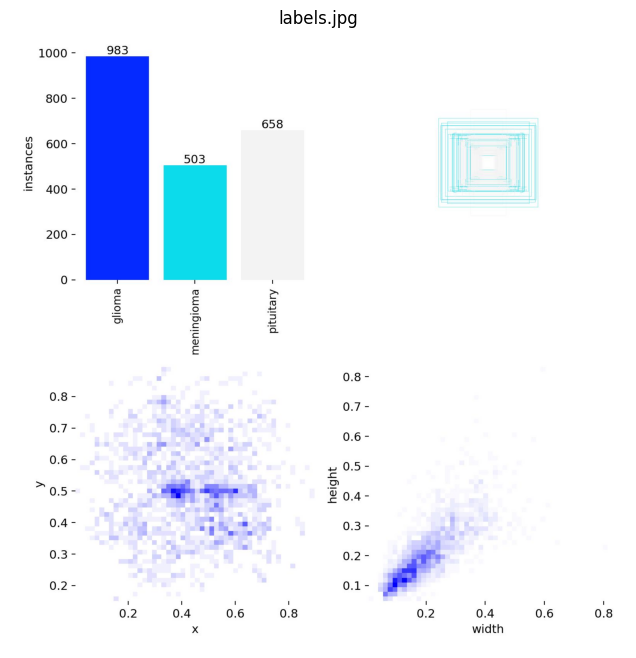

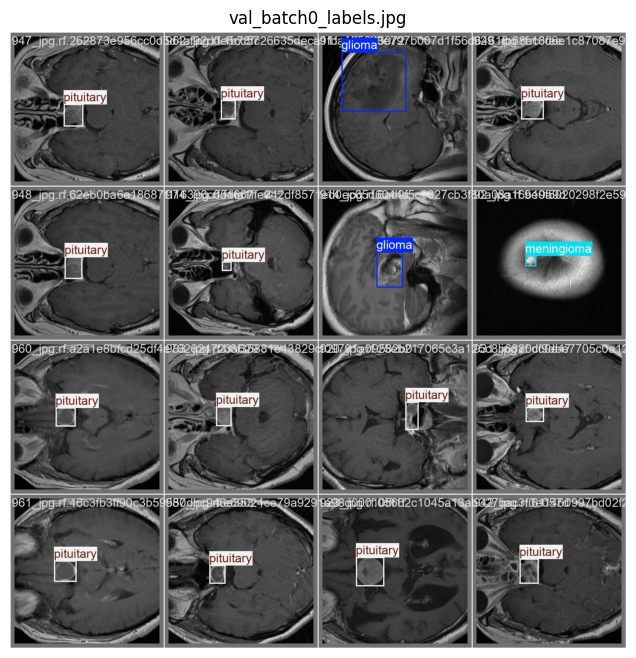

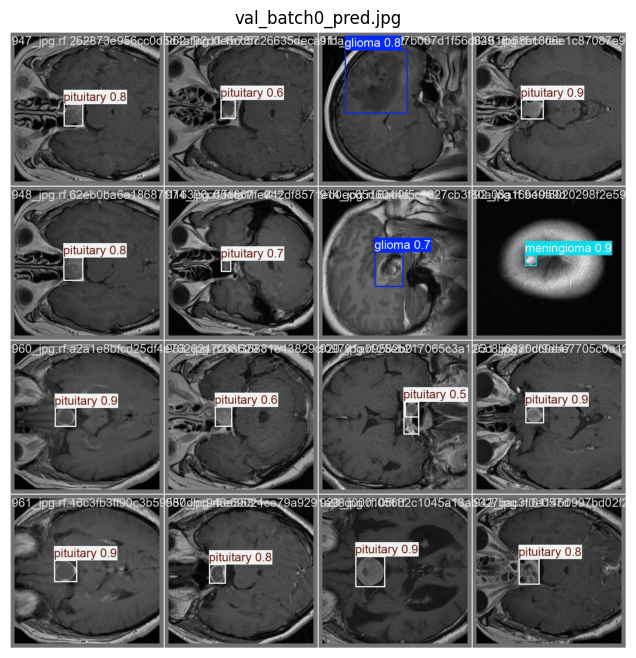

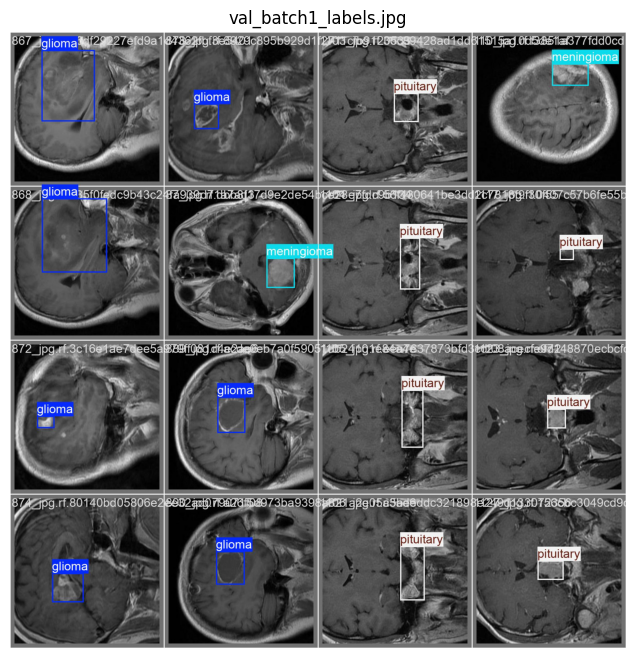

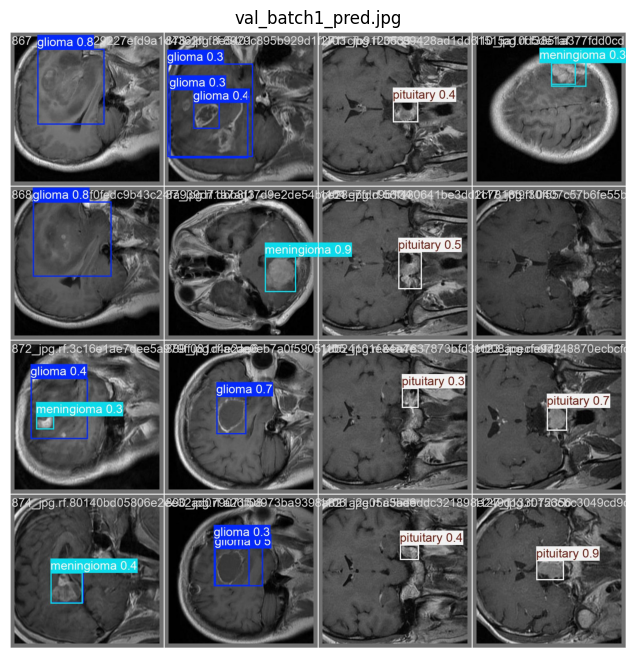

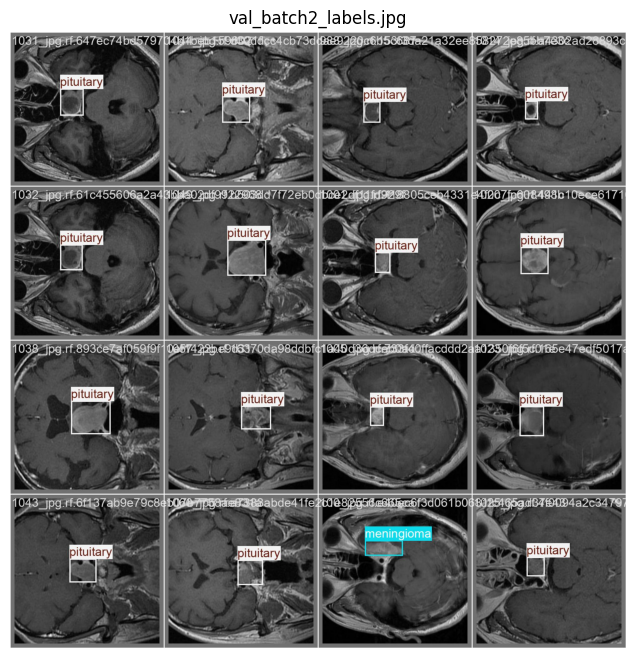

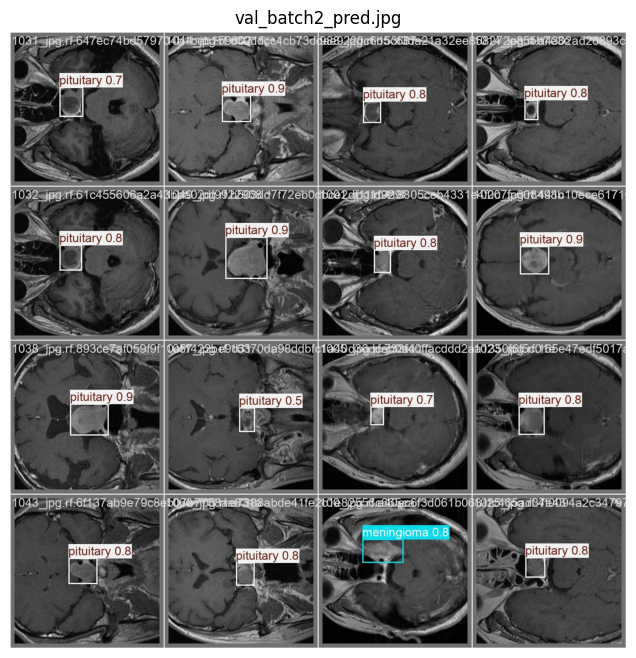

In [ ]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Root dir for your runs
base_dir = Path("/kaggle/working/baselines/yolo11/runs")

# Common artifacts produced by YOLO training
artifact_files = [
    "confusion_matrix.png",
    "confusion_matrix_normalized.png",
    "BoxPR_curve.png",
    "BoxF1_curve.png",
    "BoxP_curve.png",
    "BoxR_curve.png",
    "pr_curve.png",
    "results.png",
    "labels.jpg",
    "val_batch0_labels.jpg",
    "val_batch0_pred.jpg",
    "val_batch1_labels.jpg",
    "val_batch1_pred.jpg",
    "val_batch2_labels.jpg",
    "val_batch2_pred.jpg"
]

def show_artifact(img_path):
    """Load and display an image artifact."""
    img = cv2.imread(str(img_path))
    if img is None:
        print("❌ Could not load:", img_path)
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8,8))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_path.name)
    plt.show()

def show_run_artifacts(run_dir):
    """Show all artifacts for a given run folder."""
    print(f"\n📊 Showing results for: {run_dir.name}\n")
    for f in artifact_files:
        fpath = run_dir / f
        if fpath.exists():
            show_artifact(fpath)
        else:
            print("⚠️ Missing:", f)

# Loop over all three YOLOv11 runs
for exp in ["yolo11_medium_img768_e40_bs6", "yolo11_small_img640_e30_bs8", "yolo11_tiny_img512_e35_bs12"]:
    run_path = base_dir / exp
    if run_path.exists():
        show_run_artifacts(run_path)
    else:
        print("❌ Run not found:", exp)
